#### Objective: Predict home sale prices

#### Approach: Use LASSO to generate a model from a dense and minimally pruned feature space

# Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from IPython.display import display
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Loading Data and EDA

In [2]:
df = pd.read_csv('./train.csv')
test = pd.read_csv('./test.csv')

In [3]:
# Checking relative shapes of datasets. Test set is missing target column as
# expected. Parity between the two DataFrames is imperative to making
# predictions. As such, until I find a better way, parity will be manually
# maintained
print('Training set shape:', df.shape)
print('Test set shape:', test.shape)

Training set shape: (2051, 81)
Test set shape: (879, 80)


In [4]:
df.info() # Plenty of non-numericl data and nulls to clean up

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
Id                 2051 non-null int64
PID                2051 non-null int64
MS SubClass        2051 non-null int64
MS Zoning          2051 non-null object
Lot Frontage       1721 non-null float64
Lot Area           2051 non-null int64
Street             2051 non-null object
Alley              140 non-null object
Lot Shape          2051 non-null object
Land Contour       2051 non-null object
Utilities          2051 non-null object
Lot Config         2051 non-null object
Land Slope         2051 non-null object
Neighborhood       2051 non-null object
Condition 1        2051 non-null object
Condition 2        2051 non-null object
Bldg Type          2051 non-null object
House Style        2051 non-null object
Overall Qual       2051 non-null int64
Overall Cond       2051 non-null int64
Year Built         2051 non-null int64
Year Remod/Add     2051 non-null int64
Roof Style         20

In [5]:
df.describe()

,Id,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2051.000000,2.051000e+03,2051.000000,1721.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2029.000000,...,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000
mean,1474.033642,7.135900e+08,57.008776,69.055200,10065.208191,6.112140,5.562165,1971.708922,1984.190151,99.695909,...,93.833740,47.556802,22.571916,2.591419,16.511458,2.397855,51.574354,6.219893,2007.775719,181469.701609
std,843.980841,1.886918e+08,42.824223,23.260653,6742.488909,1.426271,1.104497,30.177889,21.036250,174.963129,...,128.549416,66.747241,59.845110,25.229615,57.374204,37.782570,573.393985,2.744736,1.312014,79258.659352
min,1.000000,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,753.500000,5.284581e+08,20.000000,58.000000,7500.000000,5.000000,5.000000,1953.500000,1964.500000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129825.000000
50%,1486.000000,5.354532e+08,50.000000,68.000000,9430.000000,6.000000,5.000000,1974.000000,1993.000000,0.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,162500.000000
75%,2198.000000,9.071801e+08,70.000000,80.000000,11513.500000,7.000000,6.000000,2001.000000,2004.000000,161.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,2930.000000,9.241520e+08,190.000000,313.000000,159000.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,...,1424.000000,547.000000,432.000000,508.000000,490.000000,800.000000,17000.000000,12.000000,2010.000000,611657.000000


In [6]:
display(df.head())

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,...,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,...,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,3,2010,WD,138500


In [7]:
# Manually determine which categorical features have promise as dummies.
# Criteria are as follows:
# 1) Not too homogenous - if there is one dominent category, it won't be
# significant
# 2) Not too sparse. The data needs to speak to us. To do that, it must be there
# 3) Not too scattered. Too many values generates more columns than it may be
# worth working with
# 4) Must be non-ordinal
# ***************************************************************************** #
# Since we will be using LASSO to cull our feature set, I'm not too worried if
# some of these don't add much. They will be dealt with when the time comes.
# The commented lines were deemed unfit for inclusion.

#df['Street'].value_counts()
df['Year Built'].value_counts()
#df['Land Contour'].value_counts()
#df['Functional'].value_counts()
df['Neighborhood'].value_counts()
#df['Land Slope'].value_counts()
df['MS SubClass'].value_counts()
df['MS Zoning'].value_counts()
#df['Alley'].value_counts() # Mostly null
df['Lot Shape'].value_counts()
#df['Utilities'].value_counts()
df['Lot Config'].value_counts()
df['Condition 1'].value_counts()
#df['Condition 2'].value_counts()a
df['Bldg Type'].value_counts()
df['House Style'].value_counts()
df['Year Built'].value_counts() # Non-ordinal
df['Year Remod/Add'].value_counts() # Non-ordinal
#df['Roof Style'].value_counts()
#df['Roof Matl'].value_counts()
df['Exterior 1st'].value_counts()
#df['Exterior 2nd'].value_counts()
df['Mas Vnr Type'].value_counts()
df['Exter Qual'].value_counts()
df['Exter Cond'].value_counts()
df['Foundation'].value_counts()
df['Bsmt Qual'].value_counts()
#df['Bsmt Cond'].value_counts()
df['Bsmt Exposure'].value_counts()
df['BsmtFin Type 1'].value_counts()
#df['BsmtFin Type 2'].value_counts() # Not many with 2 basements
#df['Heating'].value_counts() # Too homogenous
df['Heating QC'].value_counts()
df['Central Air'].value_counts() # Maybe... Only one column...
#df['Electrical'].value_counts() # Too homogenous
df['Kitchen Qual'].value_counts()
#df['Functional'].value_counts() # Too homogenous
#df['Fireplace Qu'].value_counts() # Mostly null
df['Garage Type'].value_counts()
#df['Garage Yr Blt'].value_counts() # Non ordinal, though newer is better I guess
df['Garage Finish'].value_counts()
#df['Garage Qual'].value_counts() # Too homogenous
#df['Garage Cond'].value_counts() # Too homogenous
df['Paved Drive'].value_counts() # Pretty homogenous but also only adds two columns...
#df['Pool QC'].value_counts() # Mostly null values
#df['Fence'].value_counts() # Mostly null values
##df['Misc Feature'].value_counts() # Mostly null but always adds value to property
##df['Misc Val'].value_counts()
df['Mo Sold'].value_counts() # Non ordinal. Is it even relevant?
df['Yr Sold'].value_counts() # Non ordinal; prices do change through the years
df['Sale Type'].value_counts() # No idea what it means but it's worth checking out

WD       1781
New       160
COD        63
ConLD      17
CWD        10
ConLI       7
ConLw       5
Con         4
Oth         4
Name: Sale Type, dtype: int64

In [3]:
# Drop columns composed largely of null values. Still on the fence about
# the Misc Features category
df = df.drop(columns=['Alley', 'Pool QC', 'Fence', 'Misc Feature', 
                      'Lot Frontage', 'Fireplace Qu'])
test = test.drop(columns=['Alley', 'Pool QC', 'Fence', 'Misc Feature',
                          'Lot Frontage', 'Fireplace Qu'])
# Drop non-numeric columns that are not good dummy candidates
df.drop(columns=['Street', 'Land Contour', 'Functional', 'Land Slope',
                     'Utilities', 'Condition 2', 'Roof Style', 'Roof Matl',
                     'Exterior 2nd', 'Bsmt Cond', 'BsmtFin Type 2', 'Heating',
                     'Electrical', 'Functional', 'Garage Yr Blt', 'Garage Qual',
                     'Garage Cond'], inplace=True)
test.drop(columns=['Street', 'Land Contour', 'Functional', 'Land Slope',
                     'Utilities', 'Condition 2', 'Roof Style', 'Roof Matl',
                     'Exterior 2nd', 'Bsmt Cond', 'BsmtFin Type 2', 'Heating',
                     'Electrical', 'Functional', 'Garage Yr Blt', 'Garage Qual',
                     'Garage Cond'], inplace=True)

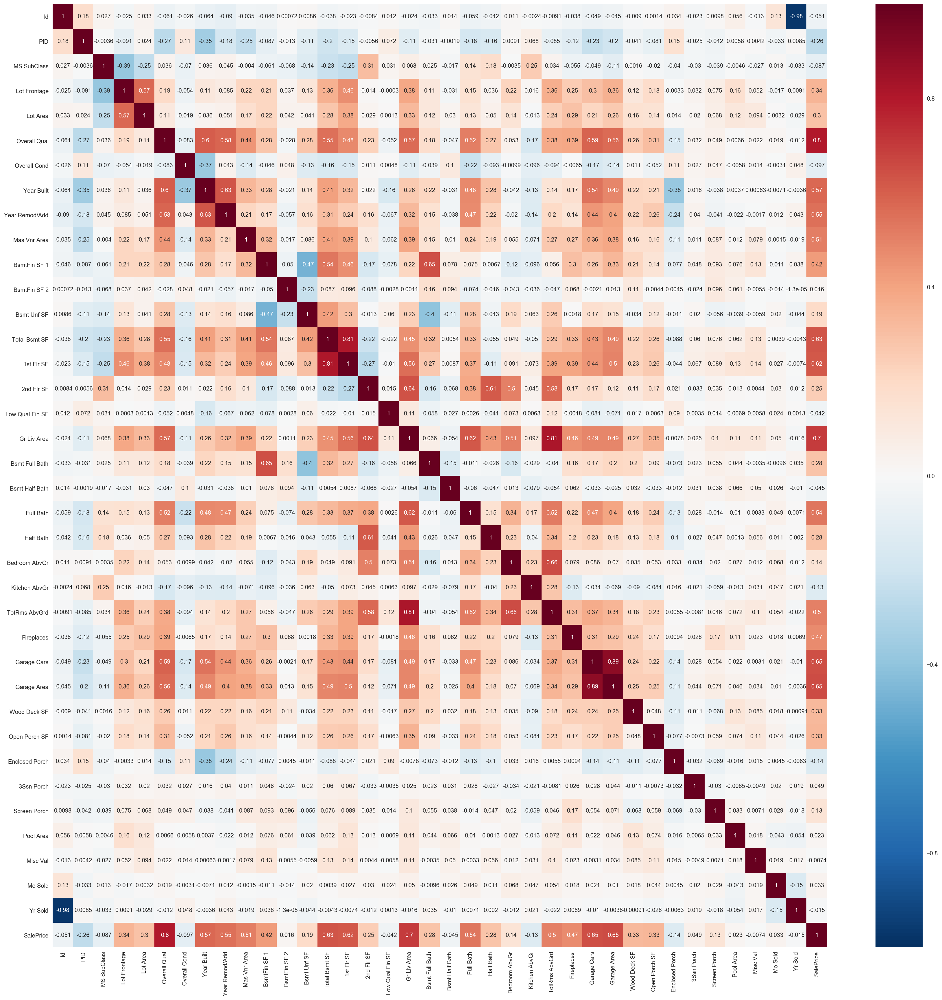

In [9]:
# Check correlations between features and target using a heatmap
fig, ax = plt.subplots(figsize=(30,30))
sns.heatmap(df.corr(), annot=True);

In [4]:
# Drop remaining columns with low correlation to target before scaling, since
# correlation is independent of scale and origin
df.drop(columns=['Pool Area', 'Screen Porch', '3Ssn Porch', 'Enclosed Porch',
                'Kitchen AbvGr', 'Bedroom AbvGr', 'Bsmt Half Bath',
                'Low Qual Fin SF', 'BsmtFin SF 2', 'PID'], inplace=True)
test.drop(columns=['Pool Area', 'Screen Porch', '3Ssn Porch', 'Enclosed Porch',
                'Kitchen AbvGr', 'Bedroom AbvGr', 'Bsmt Half Bath',
                'Low Qual Fin SF', 'BsmtFin SF 2', 'PID'], inplace=True)

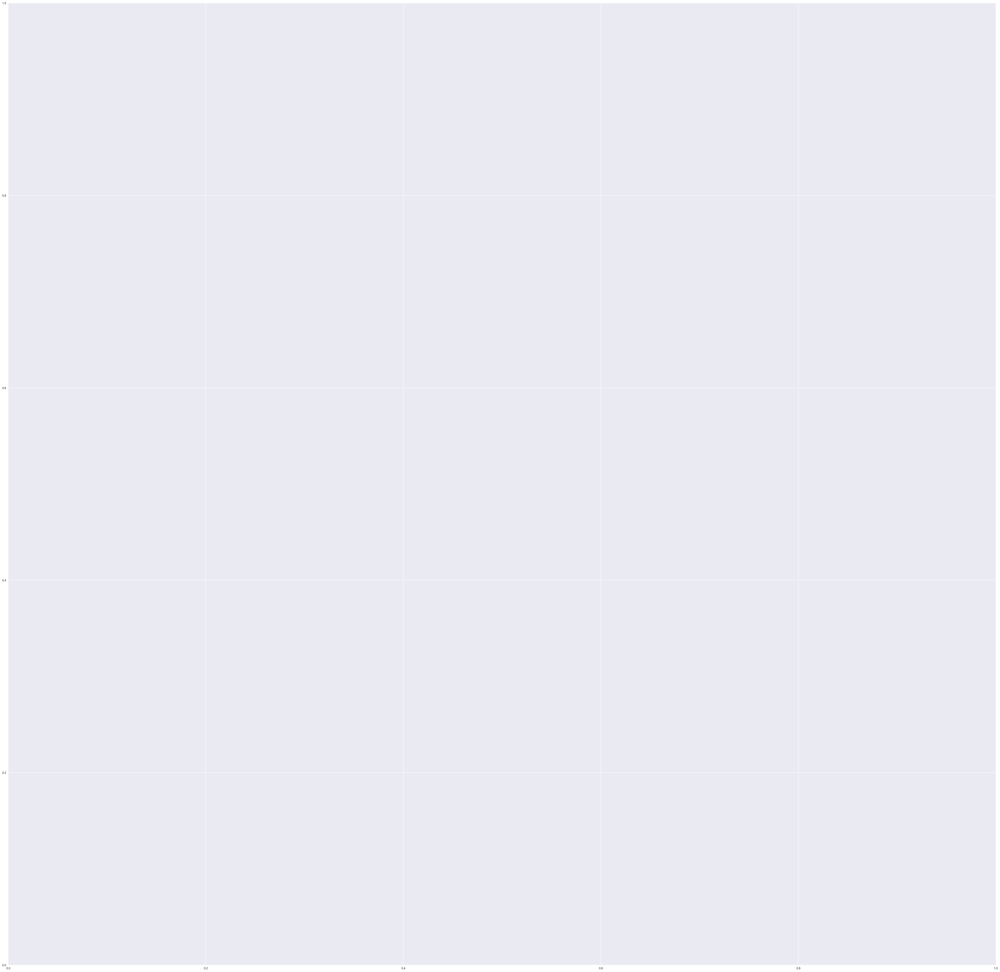

In [8]:
#fig, ax = plt.subplots(figsize=(60,60))
sns.pairplot(df.dropna());

In [11]:
# Generate dummies with potential value
df = pd.get_dummies(df, columns=['Year Built', 'Neighborhood', 'MS SubClass',
               'MS Zoning', 'Lot Shape', 'Lot Config', 'Condition 1',
               'Bldg Type', 'House Style', 'Year Remod/Add',
               'Exterior 1st', 'Mas Vnr Type', 'Exter Qual', 'Exter Cond',
               'Foundation', 'Bsmt Qual', 'Bsmt Exposure', 'BsmtFin Type 1',
               'Heating QC', 'Central Air', 'Kitchen Qual', 'Garage Type',
               'Garage Finish', 'Paved Drive', 'Mo Sold', 'Yr Sold',
               'Sale Type'], drop_first=True)
test = pd.get_dummies(test, columns=['Year Built', 'Neighborhood', 'MS SubClass',
               'MS Zoning', 'Lot Shape', 'Lot Config', 'Condition 1',
               'Bldg Type', 'House Style', 'Year Remod/Add',
               'Exterior 1st', 'Mas Vnr Type', 'Exter Qual', 'Exter Cond',
               'Foundation', 'Bsmt Qual', 'Bsmt Exposure', 'BsmtFin Type 1',
               'Heating QC', 'Central Air', 'Kitchen Qual', 'Garage Type',
               'Garage Finish', 'Paved Drive', 'Mo Sold', 'Yr Sold',
               'Sale Type'], drop_first=True)

In [12]:
print(df.info(), '\n')
print(test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Columns: 350 entries, Id to Sale Type_WD 
dtypes: float64(8), int64(15), uint8(327)
memory usage: 1023.6 KB
None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 879 entries, 0 to 878
Columns: 338 entries, Id to Sale Type_WD 
dtypes: float64(8), int64(14), uint8(316)
memory usage: 422.4 KB
None


In [13]:
# Determine what dummy columns the training set has in excess of our test set
missing_cols = set(df.columns) - set(test.columns)
print(missing_cols)

{'Year Built_1880', 'Year Built_1893', 'Year Built_1929', 'Year Built_1913', 'Year Built_1898', 'Neighborhood_Landmrk', 'Year Built_1901', 'Year Built_1896', 'Year Built_1875', 'SalePrice', 'Year Built_1911', 'Neighborhood_GrnHill', 'Year Built_1879', 'Year Built_1895', 'MS SubClass_150', 'Exterior 1st_CBlock', 'Heating QC_Po', 'Year Built_1942', 'MS Zoning_C (all)', 'Exterior 1st_ImStucc', 'Exterior 1st_Stone'}


In [14]:
# Determine what additional dummy columns the test set has in relation to the training set
add_cols = set(test.columns) - set(df.columns)
print(add_cols)

{'Year Built_1882', 'Year Built_1906', 'Sale Type_VWD', 'Mas Vnr Type_CBlock', 'Year Built_1907', 'Year Built_1904', 'Kitchen Qual_Po', 'Year Built_1902', 'Exterior 1st_PreCast'}


In [15]:
# Seperate target column before it is dropped
y = df['SalePrice']

In [16]:
# Restore parity between datasets
df.drop(columns=missing_cols, inplace=True)
test.drop(columns=add_cols, inplace=True)

In [17]:
# Find location of null vals
df.isnull().sum().sort_values(ascending=False).head()

Lot Frontage      330
Mas Vnr Area       22
Bsmt Full Bath      2
BsmtFin SF 1        1
Bsmt Unf SF         1
dtype: int64

In [18]:
# Drop Lot Frontage for excessive null values
df.drop(columns=['Lot Frontage'], inplace=True)
test.drop(columns=['Lot Frontage'], inplace=True)

In [19]:
# Fill all remaining null cells with 0's in order to model
df.fillna(0, inplace=True)
test.fillna(0, inplace=True)

# Modeling Time

In [61]:
# Define X
exclusion = ['SalePrice']
features = [col for col in df.columns if not col in exclusion]
X = df[features]

In [21]:
# Calculate baseline
max(y.value_counts(normalize=True))

0.01218917601170161

In [62]:
# TTS
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)

### Linear Regression Pipe and Grid Search

In [23]:
# Just a basic linear regression to see how good of a fit we can achieve
# without regularization
ss = StandardScaler()
lr = LinearRegression()

In [24]:
LinearRegression()
lr_pipe = Pipeline([
    ('ss', ss),
    ('lr', lr),
])

In [25]:
# Despite lacking parameters, GridSearch offers integrated CV which makes it
# preferable to pipe.fit() and so on.
lr_params = {}
gs = GridSearchCV(lr_pipe, lr_params, cv=5)
gs.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('lr', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False))]),
       fit_params=None, iid=True, n_jobs=1, param_grid={},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [26]:
# Linear Regression Scores. It doesn't make sense for the gs.score to be as
# low as it is. That being said, there is no harm in leaving that to Kaggle to
# decide.
### Upon rerunning the code, the RMSE has gone to a more reasonable value.
print(gs.best_score_)
print(gs.score(X_test, y_test))

-5.728877773317821e+19
-1270893841815033.8


In [27]:
pred = gs.predict(X)
print('RMSE for Linear Model w/o Regularization:',
      mean_squared_error(y, pred) ** .5)

RMSE for Linear Model w/o Regularization: 1199074435769.1165


### kNN Pipe and Grid Search

In [28]:
# Though it's unlikely to perform well at all given the current form of the
# data, it doesn't hurt to try and see if kNN offers value.
ss = StandardScaler()
knn = KNeighborsClassifier()

In [29]:
KNeighborsClassifier()
knn_pipe = Pipeline([
    ('ss', ss),
    ('knn', knn)
])

In [30]:
knn_params = {
     'knn__n_neighbors': range(7, 25, 2)   
}
gs = GridSearchCV(knn_pipe, param_grid=knn_params, cv=5)
gs.fit(X_train, y_train)

/Users/Arya/anaconda3/envs/dsi/lib/python3.6/site-packages/sklearn/model_selection/_split.py:605: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


GridSearchCV(cv=5, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('knn', KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform'))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'knn__n_neighbors': range(7, 25, 2)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [31]:
# kNN Scores - not too promising as predicted. Not worth checking RMSE.
print(gs.best_score_)
print(gs.best_params_)
print(gs.score(X_test, y_test))

0.01524390243902439
{'knn__n_neighbors': 11}
0.0


### LASSO Pipe and Grid Search

In [32]:
# Given the massive number of columns and lack of aggressive feature
# engineering, my hopes are highest for the LASSO model's preformance
ss = StandardScaler()
lasso = Lasso()

In [33]:
Lasso()
lasso_pipe = Pipeline([
    ('ss', ss),
    ('lasso', lasso)
])

In [34]:
# I don't know what exactly to expect, nor what range my alpha values can fall
# in, so I'll cast a wide net and see what I catch.
lasso_params = {
    'lasso__max_iter': [10000],
    'lasso__alpha': [0.1, 0.3, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0,
                    6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0,
                    16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0,
                    25.0, 26.0, 27.0, 29.0, 30.0]
}
gs = GridSearchCV(lasso_pipe, param_grid=lasso_params, cv=3) # CV = 3 for time
gs.fit(X_train, y_train)

GridSearchCV(cv=3, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('lasso', Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'lasso__max_iter': [10000], 'lasso__alpha': [0.1, 0.3, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 29.0, 30.0]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [35]:
# LASSO Scores - Given that the model is privy to the upper limit we tested
# for alpha, it makes sense to keep going higher until we hit a ceiling.
print(gs.best_score_)
print(gs.best_params_)
print(gs.score(X_test, y_test))

0.8302169074320791
{'lasso__alpha': 30.0, 'lasso__max_iter': 10000}
0.8029406182195243


##### Lasso Run 2

In [36]:
Lasso()
lasso_pipe = Pipeline([
    ('ss', ss),
    ('lasso', lasso)
])

In [37]:
lasso_params = {
    'lasso__max_iter': [10000],
    'lasso__alpha': range(30, 50, 1)
}
gs = GridSearchCV(lasso_pipe, param_grid=lasso_params, cv=3)
gs.fit(X_train, y_train)

GridSearchCV(cv=3, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('lasso', Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'lasso__max_iter': [10000], 'lasso__alpha': range(30, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [38]:
# Model score is improving slightly, however we are still at our upper limit
print(gs.best_score_)
print(gs.best_params_)
print(gs.score(X_test, y_test))

0.8339248301634024
{'lasso__alpha': 49, 'lasso__max_iter': 10000}
0.8063904068286476


##### Lasso Run 3

In [39]:
Lasso()
lasso_pipe = Pipeline([
    ('ss', ss),
    ('lasso', lasso)
])

In [40]:
lasso_params = {
    'lasso__max_iter': [10000],
    'lasso__alpha': range(50, 100, 1)
}
gs = GridSearchCV(lasso_pipe, param_grid=lasso_params, cv=3)
gs.fit(X_train, y_train)

GridSearchCV(cv=3, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('lasso', Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'lasso__max_iter': [10000], 'lasso__alpha': range(50, 100)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [41]:
# Model score has only improved marginally. Perhaps the scale is too small
print(gs.best_score_)
print(gs.best_params_)
print(gs.score(X_test, y_test))

0.8414024040504171
{'lasso__alpha': 99, 'lasso__max_iter': 10000}
0.811842179186351


##### Lasso Run 4

In [42]:
Lasso()
lasso_pipe = Pipeline([
    ('ss', ss),
    ('lasso', lasso)
])

In [43]:
lasso_params = {
    'lasso__max_iter': [10000],
    'lasso__alpha': range(100, 300, 3)
}
gs = GridSearchCV(lasso_pipe, param_grid=lasso_params, cv=3)
gs.fit(X_train, y_train)

GridSearchCV(cv=3, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('lasso', Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'lasso__max_iter': [10000], 'lasso__alpha': range(100, 300, 3)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [44]:
# How long can this go on?
print(gs.best_score_)
print(gs.best_params_)
print(gs.score(X_test, y_test))

0.8521678357078994
{'lasso__alpha': 298, 'lasso__max_iter': 10000}
0.8189620816762155


##### Lasso Run 5

In [63]:
Lasso()
lasso_pipe = Pipeline([
    ('ss', ss),
    ('lasso', lasso)
])

In [64]:
lasso_params = {
    'lasso__max_iter': [10000],
    'lasso__alpha': range(300, 1000, 3)
}
gs = GridSearchCV(lasso_pipe, param_grid=lasso_params, cv=3)
gs.fit(X_train, y_train)

GridSearchCV(cv=3, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('lasso', Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'lasso__max_iter': [10000], 'lasso__alpha': range(300, 1000, 3)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [65]:
# At last we seem to have found the ballpark for an optimal alpha value!
### On the first run through the code, the ideal alpha given was 413.9. It now
### sits at 561. While it is expected for this value to change, the difference
### is quite dramatic. I will rerun the code from the necessary spot to observe
### to what extent it continues to vary.
##### The third iteration has yielded an ideal alpha of 744! This warrants
##### further examination
print(gs.best_score_)
print(gs.best_params_)
print(gs.score(X_test, y_test))

0.8197841676638667
{'lasso__alpha': 744, 'lasso__max_iter': 10000}
0.8916477318051698


##### Lasso alpha refinement

In [66]:
Lasso()
lasso_pipe = Pipeline([
    ('ss', ss),
    ('lasso', lasso)
])

In [49]:
### Clearly this was intended for the first run when the ideal alpha was in
### the middle of the range given.
lasso_params = {
    'lasso__max_iter': [10000],
    'lasso__alpha': [(x * 0.1) + 411 for x in range(50)] # To produce floats in range
}
gs = GridSearchCV(lasso_pipe, param_grid=lasso_params, cv=3)
gs.fit(X_train, y_train)

GridSearchCV(cv=3, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('lasso', Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False))]),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'lasso__max_iter': [10000], 'lasso__alpha': [411.0, 411.1, 411.2, 411.3, 411.4, 411.5, 411.6, 411.7, 411.8, 411.9, 412.0, 412.1, 412.2, 412.3, 412.4, 412.5, 412.6, 412.7, 412.8, 412.9, 413.0, 413.1, 413.2, 413.3, 413.4, 413.5, 413.6, 413.7, 413.8, 413.9, 414.0, 414.1, 414.2, 414.3, 414.4, 414.5, 414.6, 414.7, 414.8, 414.9, 415.0, 415.1, 415.2, 415.3, 415.4, 415.5, 415.6, 415.7, 415.8, 415.9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [50]:
# A satisfactory alpha value (alpha = 413.9)
### At least it was on the original run
print(gs.best_score_)
print(gs.best_params_)
print(gs.score(X_test, y_test))

0.8540290353433936
{'lasso__alpha': 415.9, 'lasso__max_iter': 10000}
0.8197830490149501


In [51]:
# Oddly enough this model produces a higher RMSE than the plain linear model
### This has since rectified itself.
pred = gs.predict(X)
print('RMSE for LASSO Model (alpha = 413.9):',
      mean_squared_error(y, pred) ** .5)

RMSE for LASSO Model (alpha = 413.9): 25734.180155864553


# Preparing First Submission

In [69]:
# Set X equal to testing dataframe
X = test

# Predict target values
pred = gs.predict(X)

In [70]:
# Generate first submission df
sub_one = pd.DataFrame(data=pred, index=test['Id'])
sub_one.columns = ['SalePrice']

In [71]:
# Export to CSV
sub_one.to_csv('./sub_one.csv') # RMSE = 37882.77012 (24th place)

# Preparing Second Submission

In [55]:
# Out of curiosity, I wanted to see how the MLR performed. Below we wil rerun
# the necessary code to regenerate the model.
X = df[features]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)

In [56]:
ss = StandardScaler()
LinearRegression()
lr_pipe = Pipeline([
    ('ss', ss),
    ('lr', lr),
])

In [57]:
lr_params = {}
gs = GridSearchCV(lr_pipe, lr_params, cv=10)
gs.fit(X_train, y_train)

GridSearchCV(cv=10, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('ss', StandardScaler(copy=True, with_mean=True, with_std=True)), ('lr', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False))]),
       fit_params=None, iid=True, n_jobs=1, param_grid={},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [58]:
# Set X equal to testing dataframe
X = test

# Predict target values
pred = gs.predict(X)

In [59]:
# Generate second submission df
sub_two = pd.DataFrame(data=pred, index=test['Id'])
sub_two.columns = ['SalePrice']

In [60]:
# Export to CSV
sub_two.to_csv('./sub_two.csv') # RMSE = 95203414630844.20000 # As it should be

# Conclusions

While implementing LASSO as a means of feature selection hurt the interpretability of the model, it was successful in producing a viable model from an overly complex feature set. To further improve the model, I would integrate interaction terms with the polynomial features module and probably use elastic net to take advantage of ridge penalties. The use of pipelines reduces the implementation times of these features, however learning about them the day before the submission deadline, coupled with other unforeseen complications that have taken away from the time available to work on this project are limiting factors. That being said, this project was a fantastic learning experience; beyond figuring out how to make a workflow such as this work for Kaggle competitions, it became necessary to further understand how the LASSO model achieves what it does and how exactly the potential range of alpha values can vary so drastically across applications.

###### Questions and tasks that remain:

1) What is the effect of standardizing the dataset before generating dummy columns vs. after?  
2) What criteria make for good interaction terms?  
3a) When should one generate polynomial terms in addition to the interaction terms?  
3b) What criteria determine the degree of the poly_terms to generate?  
4) How would elastic ridge perform against just LASSO in this case?  
5) How can one determine what features were eliminated by LASSO rather than just having the function spit out a model?